# Intro
In this notebook we will generate all the artifacts necessary to format our data.

The objective is generate a dataset to get chunks of $T$ seconds. To do that, we will generate a CSV file that contains the following information:
$$
\begin{table}[]
\begin{tabular}{lll}
path & start_time & end_time \\
audio1 & 0 & 10 \\
audio1 & 10 & 20 \\
audio1 & 20 & 30 \\
audio2 & 0 & 10 \\
audio2 & 10 & 20
\end{tabular}
\end{table}
$$

#Setup

In [24]:
!pip install essentia

In [25]:
#from google.colab import drive
import pathlib
import essentia.standard as es
import glob
import pandas as pd
import math
import numpy as np
import time
import matplotlib.pyplot as plt
import torch
from IPython.display import Audio

In [26]:
# Mount Google Drive
#drive.mount('/content/drive')
data_path = pathlib.Path('/content/drive/MyDrive/UPF/6th Year/Assignatures'
                         '/SCAV/Audio/Project/audio')

In [27]:
data_path = pathlib.Path('audio')

# Generate CSV

In [28]:
def get_chunks_intervals(t: int, duration: int):
    """
    Compute the start time and end time (in seconds) of
    all the chunks of t seconds that fit in the given
    duration.

    :param t: duration of each chunk in seconds
    :param duration: total duration in seconds
    """

    slices = np.arange(0, duration - t, t)

    chunks = [[_s, _s + t] for _s in slices]

    ''' # Add the last chunk interval since it could
    # be the case that duration / t is not an 
    # integer number
    chunks.append(
        [chunks[-1][1], duration]
    ) '''

    return chunks

get_chunks_intervals(10, 70)

[[0, 10], [10, 20], [20, 30], [30, 40], [40, 50], [50, 60]]

In [29]:
audios = glob.glob(str(data_path / "*.mp3"))

In [30]:
data_dict = {}
i = 0 # index to give a key to the data_dict

t = 10 # chunk duration

for _a in audios:
    metadata = es.MetadataReader(
        filename=_a)()
    duration = metadata[-4]

    # Divide in chunks
    chunks_intervals = get_chunks_intervals(t, duration)

    # build dataset
    audio_name = _a.split("/")[-1]

    for c_inter in chunks_intervals:
        start_time = c_inter[0]
        end_time = c_inter[1]

        data_dict[i] = {
            "name": audio_name,
            "start_time": start_time,
            "end_time": end_time,
        }

        i = i + 1

data_df = pd.DataFrame.from_dict(data_dict, orient = 'index')

# Shuffle data
#data_df.sample(frac=1).reset_index(drop=True)

In [31]:
data_df.head()

,name,start_time,end_time
0,"6327674 RUN-DMC - Mary, Mary (Original Mix).mp3",0,10
1,"6327674 RUN-DMC - Mary, Mary (Original Mix).mp3",10,20
2,"6327674 RUN-DMC - Mary, Mary (Original Mix).mp3",20,30
3,"6327674 RUN-DMC - Mary, Mary (Original Mix).mp3",30,40
4,"6327674 RUN-DMC - Mary, Mary (Original Mix).mp3",40,50


In [32]:
expected_duration = 120 # seconds

total = 0
incomplete_audios = 0 # audios with less than 120 seconds

for _a in audios:
    metadata = es.MetadataReader(
        filename=_a)()
    
    # Position -4 because of 
    # https://essentia.upf.edu/reference/std_MetadataReader.html
    duration = metadata[-4]

    if duration != expected_duration:
        # Divide in chunks
        chunks_intervals = get_chunks_intervals(t, duration)

        total = total + len(chunks_intervals)
        incomplete_audios = incomplete_audios + 1

missing_chunks = incomplete_audios * expected_duration / t - total

expected_missing_chunks = 25
assert missing_chunks == expected_missing_chunks

## Save it to disk

In [33]:
data_filename = "audio_chunks.csv"
data_df.to_csv(data_path / data_filename, index=False, sep=";")

# Splitting data in Training, Validation and Testing

In [37]:
data_filename = "audio_chunks.csv"
audio_data = pd.read_csv(data_path / data_filename, index_col = False, sep=";")

dataset_size = len(audio_data)

# Shuffle data
audio_data = audio_data.sample(frac=1, ignore_index=True)

In [ ]:
train_perc = 0.6
val_perc = 0.2
test_perc = 0.2

assert train_perc + val_perc + test_perc == 1.0

train_size = round(train_perc * dataset_size)
val_size = round(val_perc * dataset_size)
test_size = dataset_size - (train_size + val_size)

assert train_size + val_size + test_size == dataset_size

train_data = audio_data.iloc[0:train_size]
val_data = audio_data.iloc[train_size:val_size + train_size]
test_data = audio_data.iloc[val_size + train_size:val_size + train_size + test_size]

assert len(train_data) == train_size
assert len(val_data) == val_size
assert len(test_data) == test_size

In [35]:
display(train_data)
display(val_data)
display(test_data)

,name,start_time,end_time
0,299509 Barbara Morgenstern - Eine Verabredung ...,50,60
1,298535 Marschmellows - Katsuo (Original Mix).mp3,80,90
2,298914 Comiccon - Komodo (Kindervater Radio Mi...,90,100
3,920580 Cosmic Navigators - First Tour (Origina...,60,70
4,299470 Plastic Operator - Parasols (Original M...,60,70
...,...,...,...
9792,4323121 Offer Nissim - Bimbo (Original Mix).mp3,40,50
9793,5498352 Zareh Kan - Banger (Original Mix).mp3,90,100
9794,4164104 Da Youngfellaz - Cruisin (feat. K-Quic...,0,10
9795,5211090 Wild SpeeD - Darktek (Original Mix).mp3,50,60


,name,start_time,end_time
9797,3400910 Fabio Vi - El sueno de Cuba (Original ...,10,20
9798,3999467 Woody Guthrie - Railroad Blues (Origin...,70,80
9799,984534 Nappy Riddem - Rastar (Quincy Jointz In...,40,50
9800,3296534 Tom Colontonio - Sparkover (Sean Tyas ...,80,90
9801,269382 Vision & Canedy - Aeroplane (Original M...,80,90
...,...,...,...
13058,297767 Rick Pier O'Neil - Illusion (RPO Part 1...,90,100
13059,5382659 Cr3S - B1 - Acqua (Original Mix).mp3,50,60
13060,1807862 Dyno - Cruda (Marco Dassi Zurich Remix...,100,110
13061,3011454 DJ Melo - Corrosion (Moombahton Origin...,80,90


,name,start_time,end_time
13063,"805746 Pompero, Forseco - Pompero (Forseco Rem...",30,40
13064,297811 Polyharmonique - Piango Gemo (Original ...,50,60
13065,3607700 Chewie - Survival (Riskotheque Remix).mp3,40,50
13066,1290620 Ghislain Poirier - Blazin feat. Face-T...,40,50
13067,299772 The Timewriter - Night Train (Original ...,30,40
...,...,...,...
16324,255895 GusGus - Moss feat. Daniel Agust (Origi...,20,30
16325,4202945 Freq - Sunglider (Original Mix).mp3,70,80
16326,5886473 Reprise Project - Restour (Again House...,90,100
16327,297617 Neptuner - This Dream (Mario Chris Remi...,20,30


## Save the datasets to disk

In [36]:
train_filename = "train_data.csv"
val_filename = "val_data.csv"
test_filename = "test_data.csv"
train_data.to_csv(data_path / train_filename, index=False, sep=";")
val_data.to_csv(data_path / val_filename, index=False, sep=";")
test_data.to_csv(data_path / test_filename, index=False, sep=";")

# Test

## Test how last to download the first 10 seconds of all the audios

In [11]:
test_filename = data_path / \
                '6535130 Under Break - Chapter One (Original Mix).mp3'
audio = es.EasyLoader(filename=str(test_filename),
                      sampleRate=44100, startTime=0, endTime=10)()
print(audio.shape)

(441000,)


In [12]:
files = glob.glob(str(data_path / "*.mp3"))

start_time = time.time()

for _f in files:
    audio = es.EasyLoader(filename=str(_f),
                      sampleRate=44100, startTime=0, endTime=10)()

end_time = time.time()


print(end_time - start_time)

232.33636355400085


## Try to load a batch of 100 files using the chunks csv

In [13]:
data_filename = "audio_chunks.csv"
audio_data = pd.read_csv(data_path / data_filename, index_col = False)

# Shuffle data
audio_data = audio_data.sample(frac=1, ignore_index=True)

In [14]:
audio_data.head()

,name,start_time,end_time
0,297335 Matthew Dear - Deserter (Four Tet Remix...,10,20
1,297627 Espresso Del Lago - Cinquo Dias (Origin...,50,60
2,6180590 1Shot - No Hero (The Disciples Remix).mp3,0,10
3,4186569 Dead Rows - Never See (Original Mix).mp3,0,10
4,5672671 Erorped - Lysergic State (Original Mix...,40,50


### Read the metadata of all the chunks

In [15]:
''' for _, _a in audio_data.iterrows():
    print(_a["name"])
    f = data_path / _a["name"]
    start_time = _a["start_time"]
    end_time = _a["end_time"]

    metadata = es.MetadataReader(
        filename=str(f))()
    duration = metadata[-4]

    print(duration) '''

' for _, _a in audio_data.iterrows():\n    print(_a["name"])\n    f = data_path / _a["name"]\n    start_time = _a["start_time"]\n    end_time = _a["end_time"]\n\n    metadata = es.MetadataReader(\n        filename=str(f))()\n    duration = metadata[-4]\n\n    print(duration) '

### Open $t$ seconds of the first 100 chunks

In [16]:
''' def load_chunk(data):
    f = data_path / _a["name"]
    start_time = _a["start_time"]
    end_time = _a["end_time"]

    audio = es.EasyLoader(filename=str(f),
                          sampleRate=44100, 
                          startTime=start_time, 
                          endTime=end_time)()

    return audio '''

' def load_chunk(data):\n    f = data_path / _a["name"]\n    start_time = _a["start_time"]\n    end_time = _a["end_time"]\n\n    audio = es.EasyLoader(filename=str(f),\n                          sampleRate=44100, \n                          startTime=start_time, \n                          endTime=end_time)()\n\n    return audio '

In [17]:
''' data_short = audio_data.iloc[:500] '''

' data_short = audio_data.iloc[:500] '

In [18]:
''' timer_start = time.time()

loaded_data = [load_chunk(_a) for _, _a 
               in data_short.iterrows()]

timer_end = time.time()
total_time = timer_end - timer_start
print(f"It lasts {total_time} to load 100 chunks") '''

' timer_start = time.time()\n\nloaded_data = [load_chunk(_a) for _, _a \n               in data_short.iterrows()]\n\ntimer_end = time.time()\ntotal_time = timer_end - timer_start\nprint(f"It lasts {total_time} to load 100 chunks") '

#### Parallelized...

In [19]:
''' workers = [2, 4, 8, 16] '''

' workers = [2, 4, 8, 16] '

In [20]:
''' from concurrent.futures import ThreadPoolExecutor, as_completed

results_time = []

for w in workers:
    timer_start = time.time()


    with ThreadPoolExecutor(max_workers = w) as executor:
        results = executor.map(load_chunk, data_short.iterrows())

        loaded_data = [r for r 
                    in results]

    timer_end = time.time()
    total_time = timer_end - timer_start
    print(f"It lasts {total_time} to load 100 chunks")

    results_time.append(total_time) '''

' from concurrent.futures import ThreadPoolExecutor, as_completed\n\nresults_time = []\n\nfor w in workers:\n    timer_start = time.time()\n\n\n    with ThreadPoolExecutor(max_workers = w) as executor:\n        results = executor.map(load_chunk, data_short.iterrows())\n\n        loaded_data = [r for r \n                    in results]\n\n    timer_end = time.time()\n    total_time = timer_end - timer_start\n    print(f"It lasts {total_time} to load 100 chunks")\n\n    results_time.append(total_time) '

In [21]:
''' plt.plot(workers, results_time)
plt.show() '''

' plt.plot(workers, results_time)\nplt.show() '

In [22]:
''' from concurrent.futures import ProcessPoolExecutor, as_completed

results_time = []

if __name__ == "__main__":

    for w in workers:
        timer_start = time.time()

        with ProcessPoolExecutor(max_workers = w) as executor:
            results = executor.map(load_chunk, data_short.iterrows())

            loaded_data = [r for r 
                        in results]

        timer_end = time.time()
        total_time = timer_end - timer_start
        print(f"It lasts {total_time} to load 100 chunks")

        results_time.append(total_time) '''

' from concurrent.futures import ProcessPoolExecutor, as_completed\n\nresults_time = []\n\nif __name__ == "__main__":\n\n    for w in workers:\n        timer_start = time.time()\n\n        with ProcessPoolExecutor(max_workers = w) as executor:\n            results = executor.map(load_chunk, data_short.iterrows())\n\n            loaded_data = [r for r \n                        in results]\n\n        timer_end = time.time()\n        total_time = timer_end - timer_start\n        print(f"It lasts {total_time} to load 100 chunks")\n\n        results_time.append(total_time) '

In [23]:
''' plt.plot(workers, results_time)
plt.show() '''

' plt.plot(workers, results_time)\nplt.show() '

# DataLoader

In [38]:
def compute_spectrogram(x, fft_size=1024, hop_size=1024, window_type='square'):
    """ Gets the spectrogram of waveform x
    
    Args:
        x (numpy.array): Array of samples
        fft_size (int): FFT size
        hop_size (int): Hop size between windows
        window_type (str): Window type (e.g. 'square' or 'hann')

    Returns:
        (np.array): Spectrogram with shape (num_frames, fft_size / 2 + 1) 
    """
    w = es.Windowing(type=window_type)
    fft = es.FFT()
    spectrogram = list()
    for frame in es.FrameGenerator(x,
                                   frameSize=fft_size,
                                   hopSize=hop_size,
                                   startFromZero=True):
        windowed_frame = w(frame)
        fft_windowed_frame = fft(windowed_frame)
        spectrogram.append(fft_windowed_frame)
    spectrogram = np.array(spectrogram)

    # We do this to use the full dynamic range before quantization:
    spectrogram /= np.max(np.abs(spectrogram))

    return spectrogram

In [43]:

#Making native class loader
class AudioDB(torch.utils.data.Dataset):
    # Initialization method for the dataset
    def __init__(self, data_filename, 
                 data_path,
                 transform = None,
                 fs = 44100,
                 fft_size=1024,
                 hop_size=1024, 
                 window_type='square'):
        self.audio_df = pd.read_csv(data_filename, sep=";")
        self.audio_df = self.audio_df.sample(frac=1, 
                                             ignore_index=True)

        self.data_path = data_path
        self.transform = transform
        self.fs = fs
        self.fft_size = fft_size
        self.hop_size = hop_size
        self.window_type = window_type

    # What to do to load a single item in the dataset ( read image and label)    
    def __getitem__(self, index):
        sample_data = self.audio_df.iloc[index]

        f = self.data_path / sample_data["name"]
        start_time = int(sample_data["start_time"])
        end_time = int(sample_data["end_time"])
        
        audio_data = es.EasyLoader(filename=str(f),
                                   sampleRate=self.fs,
                                   startTime=start_time, 
                                   endTime=end_time)()
        
        dft = compute_spectrogram(audio_data,
                                  self.fft_size,
                                  self.hop_size,
                                  self.window_type)
        """ print("\n")
        print(f)
        print(start_time)
        print(end_time)
        print(len(audio_data))
        print(f"Shape: {dft.shape}")
        print("\n") """

        magnitud = np.abs(dft).T
        phase = np.angle(dft, 
                         deg=False).T

        data = np.array([magnitud,
                        phase])
        
        # get shape [bins, frames, channels]
        # where frames are audio frames, bins are the frequency bins
        # and channels refer to magnitud and phase.
        data = np.moveaxis(data, 0, 2)
        
        if self.transform is not None : 
            data = self.transform(data)

        return data

    # Return the number of images
    def __len__(self):
        return len(self.audio_df)

import torchvision.transforms as transforms

tr = transforms.Compose([
        transforms.ToTensor(), 
        ])

data_filename = data_path / "audio_chunks.csv"

batch_size = 10
audios_db = AudioDB(data_filename,
                   data_path,
                   tr)

num_workers = 8

train_loader = torch.utils.data.DataLoader(dataset=audios_db,
                                           batch_size=batch_size, 
                                           shuffle=True,
                                           num_workers = num_workers)

# Mini-batch images
audios = next(iter(train_loader))
print(audios.shape)
""" for i, dfts in enumerate(train_loader):
    print(f"\n{i}\n")
    break """

torch.Size([10, 2, 513, 431])


' for i, dfts in enumerate(train_loader):\n    print(f"\n{i}\n")\n    break '

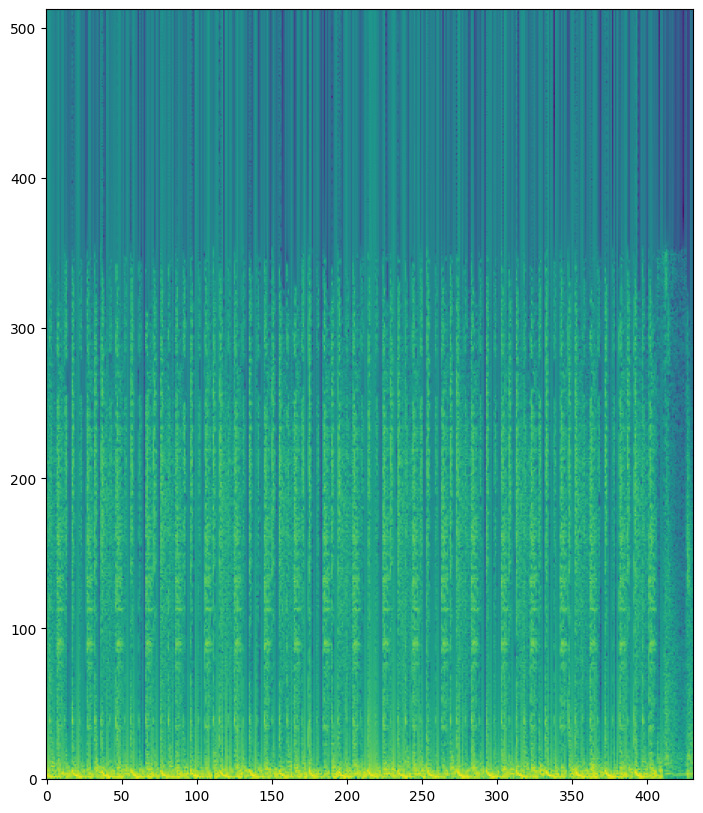

In [44]:
dfts = audios[0,0,:,:]
plt.figure(figsize=(15,10))
plt.imshow(10*np.log10(dfts.numpy() + 10**-6), origin="lower")
#plt.axis('off')
plt.show()

In [ ]:
''' problematic_file = "/content/drive/MyDrive/UPF/6th Year/Assignatures/SCAV/Audio/Project/audio/1435514 Marco Resmann - Diary No. 1 (Continuous DJ Mix).mp3"
start_time = 110
end_time = 120

metadata = es.MetadataReader(
    filename=str(problematic_file))()
duration = metadata[-4]
print(duration)

audio_data = es.EasyLoader(filename=problematic_file,
                           sampleRate=44100,
                           startTime=start_time, 
                           endTime=end_time)()
print(len(audio_data)) '''

To avoid the problem we have above, I have modified the creation
of the csv to not pick the very last chunk even if $duration \mod t == 0$

# Convert Spectrogram to audio signal

In [45]:
def compute_inverse_spectrogram(X, fft_size=1024, hop_size=1024):
    """ Gets the waveform from a spectrogram X
    
    Args:
        x (numpy.array): Array of samples
        fft_size (int): FFT size
        hop_size (int): Hop size between windows
        window_type (str): Window type (e.g. 'square' or 'hann')

    Returns:
        (np.array): Spectrogram with shape (num_frames, fft_size / 2 + 1) 
    """
    overlap_add = es.OverlapAdd(frameSize=fft_size, hopSize=hop_size)
    ifft = es.IFFT()
    y = np.array([], dtype=np.float32)
    for fft_windowed_frame in X:
        windowed_frame = ifft(fft_windowed_frame)
        frame_overlapped = overlap_add(windowed_frame)
        y = np.append(y, frame_overlapped)
    return y

In [46]:
def polar_2_rectangular(magnitude, phase):
    """Convert from a complex number from polar form \
        to rectangular form (i.e., a + b*j)-

    Args:
        magnitude (float): magnitude of the complex number
        phase (float): angle in radians of the complex number

    Returns:
        _type_: _description_
    """
    return magnitude * np.exp(1j*phase)

In [65]:
def batch_dft_to_audio(batch: torch.Tensor,
                       fft_size=1024, 
                       hop_size=1024,
                       listen=False,
                       sr = 44100) -> list:
    """Convert a batch of DFT in polar forma to audio signal

    Args:
        batch (torch.Tensor): batch of dfts in the form [B, C, FB, FR] \
            where B is the batch size; C is the number of channels \
            (in this case, the first channel is for the magnitude, \
            and the second channel, for the phase); FB is the number \
            of frequency bins and; FR is the number of frames.
        fft_size (int, optional): Size of the DFT. Defaults to 1024.
        hop_size (int, optional): Hop size of the DFT. Defaults to 1024.
        listen (boolean, optional): It displays a player to reproduce all \
            the audios in the batch.
        sr (int, optional): Sampling rate to reproduce the audio when \
            listen==True. 
    Return:
        A list of all the audios.
    """
    batch_np = batch.permute(0,2,3,1).detach().numpy()
    
    audios = list()
    
    for _b in batch_np:
        magnitude = _b[:, :, 0].T
        phase = _b[:, :, 1].T
        
        dft = polar_2_rectangular(magnitude,
                                  phase)
        
        audio = compute_inverse_spectrogram(dft, 
                                            fft_size=fft_size,
                                            hop_size=hop_size)
        
        audios.append(audio)
        
        if listen:
            display(Audio(audio, rate=44100))
    
    return audios

In [66]:
batch_dft_to_audio(audios, listen=True)

[array([1.8484475e-01, 2.1709895e-01, 2.1473533e-01, ..., 5.2154064e-08,
        1.4901161e-08, 1.4901161e-08], dtype=float32),
 array([-7.7541627e-02, -9.2599683e-02, -8.7610304e-02, ...,
         1.2665987e-07,  4.4703484e-08,  8.1956387e-08], dtype=float32),
 array([-3.1033933e-02, -2.8995201e-02, -2.5548942e-02, ...,
         2.7939677e-09, -4.6566129e-09,  3.7252903e-09], dtype=float32),
 array([-1.1658397e-01, -1.1109424e-01, -1.0333061e-01, ...,
         0.0000000e+00, -7.4505806e-09,  2.2351742e-08], dtype=float32),
 array([4.3593305e-01, 3.8317597e-01, 4.3039083e-01, ..., 4.4703484e-08,
        6.7055225e-08, 0.0000000e+00], dtype=float32),
 array([ 1.2079425e-01,  1.4293748e-01,  1.4861527e-01, ...,
        -5.9604645e-08,  1.7881393e-07, -1.1920929e-07], dtype=float32),
 array([-8.32749307e-02, -7.65965283e-02, -7.22685754e-02, ...,
        -1.21071935e-08,  0.00000000e+00,  2.23517418e-08], dtype=float32),
 array([-8.5090804e-01, -7.0358193e-01, -5.3341389e-01, ...,
       